<a href="https://colab.research.google.com/github/thiagofuruchima/olx_downloader/blob/main/Cars_ResNet50v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time

In [2]:
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
train_dir = 'img/train'
test_dir = 'img/test'
valid_dir = 'img/valid'

In [4]:
BATCH_SIZE = 128
IMG_SIZE = (224, 224)
IMG_SHAPE = (IMG_SIZE + (3,))

In [5]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                           horizontal_flip=True,
                                           zoom_range=0.3,
                                           rotation_range=60,
                                           width_shift_range=0.2,
                                           height_shift_range=0.2)

train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                     batch_size=BATCH_SIZE, 
                                                     shuffle=True, 
                                                     target_size=IMG_SIZE,
                                                     class_mode='sparse')

num_training_classes = train_generator.num_classes
num_training_intances = len(train_generator.filenames)
num_training_intances, num_training_classes

Found 145971 images belonging to 190 classes.


(145971, 190)

In [6]:
valid_datagen = ImageDataGenerator(rescale=1./255)

val_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=True,
                                                 target_size=IMG_SIZE,
                                                 class_mode='sparse')

Found 31279 images belonging to 190 classes.


In [7]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(directory=test_dir,
                                                 batch_size=1,
                                                 shuffle=True,
                                                 target_size=IMG_SIZE,
                                                 class_mode='sparse')

Found 31280 images belonging to 190 classes.


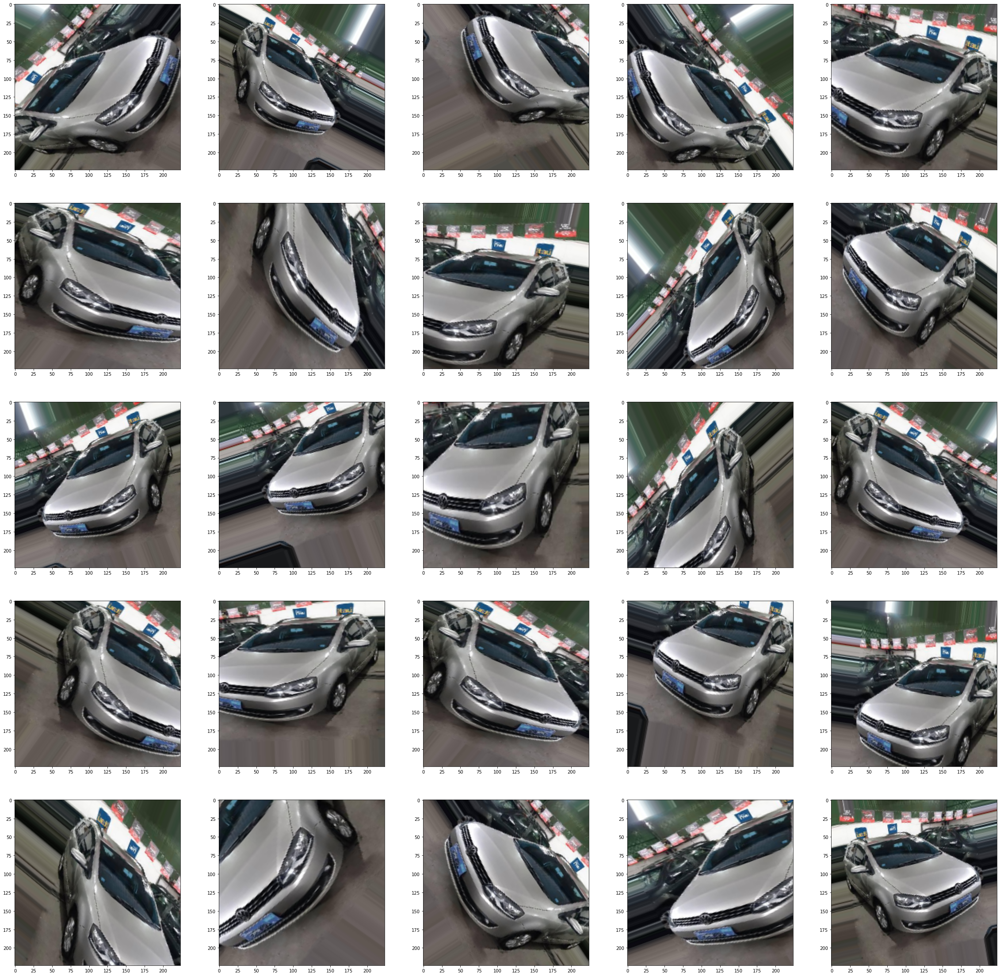

In [8]:
random_img = random.randint(0, BATCH_SIZE)
columns = 5
rows = 5
fig=plt.figure(figsize=(40, 40))
for i in range(1, columns * rows + 1):
    fig.add_subplot(rows, columns, i)
    augmented_image = train_generator[0][0][random_img]
    plt.imshow(augmented_image)
plt.show()

In [9]:
base_model = tf.keras.applications.ResNet50V2(input_shape=IMG_SHAPE,
                                               include_top=False, # Do not include the ImageNet classifier at the top.
                                               weights='imagenet') # Load weights pre-trained on ImageNet.

# Freeze the base_model
for layer in base_model.layers[:-60]:
    layer.trainable = False

# Print the architecture
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_________________________________________________________________________________________

In [10]:
# # Unfreeze the last x layers
# for layer in base_model.layers[-10:]:
#     layer.trainable =  True

In [11]:
inputs = tf.keras.Input(shape=IMG_SHAPE)

x = base_model(inputs, training=False)
x = tf.keras.layers.GlobalAvgPool2D()(x)
x = tf.keras.layers.Dense(num_training_classes, activation='relu')(x)
x = tf.keras.layers.Dropout(.1)(x)
# x = tf.keras.layers.Dense(512, activation='relu')(x)
# x = tf.keras.layers.Dropout(.1)(x)

outputs = tf.keras.layers.Dense(num_training_classes,
                                activation=tf.keras.activations.softmax,
                                kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)

model = tf.keras.models.Model(inputs, outputs)
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
resnet50v2 (Functional)      (None, 7, 7, 2048)        23564800  
_________________________________________________________________
global_average_pooling2d (Gl (None, 2048)              0         
_________________________________________________________________
dense (Dense)                (None, 190)               389310    
_________________________________________________________________
dropout (Dropout)            (None, 190)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 190)               36290     
Total params: 23,990,400
Trainable params: 17,632,896
Non-trainable params: 6,357,504
_________________________________________

In [12]:
# Define EarlyStopping as the strategy to avoid overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', 
                                                  patience = 5,
                                                  restore_best_weights=True)

In [13]:
# Define ReduceLROnPlateau as the learning schedule strategy
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(factor = 0.5,
                                                    patience = 2)

In [14]:
class SGDLRChecker(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        lr = self.model.optimizer.lr
        decay = self.model.optimizer.decay
        iterations = self.model.optimizer.iterations
        lr_with_decay = lr / (1. + decay * tf.keras.backend.cast(iterations, tf.keras.backend.dtype(decay)))
        print("Learning Rate = ", tf.keras.backend.eval(lr_with_decay))
        
lr_checker = SGDLRChecker()

In [15]:
model_name = time.strftime("%d_%m_%Y-%H_%M_%S")
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('checkpoints/' + model_name + '.h5', 
                                                      monitor = 'val_loss',
                                                      save_best_only=True,
                                                      verbose=1)

In [16]:
# Compute the class weights
from sklearn.utils import class_weight

class_weights = dict(enumerate(class_weight.compute_class_weight('balanced',
                                                                 classes=np.unique(train_generator.classes), 
                                                                 y=train_generator.classes)))
class_weights

{0: 0.7539434946542017,
 1: 1.2677696717040126,
 2: 2.6583682389364416,
 3: 1.0438429633867277,
 4: 0.74014298752662,
 5: 3.036634075306844,
 6: 0.74014298752662,
 7: 2.5189128559102674,
 8: 2.7536502546689303,
 9: 3.7660216718266253,
 10: 3.161598440545809,
 11: 3.747650834403081,
 12: 0.7261516267038106,
 13: 0.7140041087849736,
 14: 0.74014298752662,
 15: 1.4831436699857752,
 16: 1.0760061919504644,
 17: 2.2865131578947366,
 18: 3.1746628969117006,
 19: 1.141557832173301,
 20: 0.7458916709248851,
 21: 1.0042724458204335,
 22: 1.0003495065789474,
 23: 0.7234165923282784,
 24: 1.2156145902731512,
 25: 0.7365948428117273,
 26: 1.4888922888616891,
 27: 0.7323817169233857,
 28: 0.7344822381000302,
 29: 0.9774407392527119,
 30: 0.7247815292949354,
 31: 0.7302931759055433,
 32: 0.7358892921960073,
 33: 0.7275269138755981,
 34: 1.3431266102318733,
 35: 0.7509955240006174,
 36: 0.7365948428117273,
 37: 0.7193524541691307,
 38: 0.7358892921960073,
 39: 2.3711988304093565,
 40: 1.0928427042000

In [17]:
# Define the optimizer, loss and metrics
LEARNING_RATE = 0.01

model.compile(optimizer=tf.keras.optimizers.SGD(lr=LEARNING_RATE, momentum=0.9, decay=1e-4),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [18]:
EPOCHS = 100

history = model.fit(train_generator,
                    epochs=EPOCHS,
                    callbacks=[early_stopping, lr_scheduler, lr_checker, model_checkpoint],
                    validation_data=val_generator,
                    class_weight=class_weights
                   )

Epoch 1/100
1141/1141 [==============================] - 2159s 2s/step - loss: 5.3116 - accuracy: 0.0119 - val_loss: 3.7215 - val_accuracy: 0.1566
Learning Rate =  0.008975855

Epoch 00001: val_loss improved from inf to 3.72147, saving model to checkpoints\08_04_2021-23_23_22.h5
Epoch 2/100
1141/1141 [==============================] - 1457s 1s/step - loss: 3.6215 - accuracy: 0.1794 - val_loss: 2.5512 - val_accuracy: 0.3794
Learning Rate =  0.008141996

Epoch 00002: val_loss improved from 3.72147 to 2.55118, saving model to checkpoints\08_04_2021-23_23_22.h5
Epoch 3/100
1141/1141 [==============================] - 1456s 1s/step - loss: 2.5347 - accuracy: 0.3791 - val_loss: 1.8215 - val_accuracy: 0.5442
Learning Rate =  0.0074499

Epoch 00003: val_loss improved from 2.55118 to 1.82154, saving model to checkpoints\08_04_2021-23_23_22.h5
Epoch 4/100
1141/1141 [==============================] - 1453s 1s/step - loss: 2.0268 - accuracy: 0.4927 - val_loss: 1.4227 - val_accuracy: 0.6376
Learnin

Epoch 31/100
1141/1141 [==============================] - 1521s 1s/step - loss: 0.4273 - accuracy: 0.8734 - val_loss: 0.4499 - val_accuracy: 0.8850
Learning Rate =  0.002204051

Epoch 00031: val_loss improved from 0.45051 to 0.44992, saving model to checkpoints\08_04_2021-23_23_22.h5
Epoch 32/100
1141/1141 [==============================] - 1508s 1s/step - loss: 0.4142 - accuracy: 0.8778 - val_loss: 0.4393 - val_accuracy: 0.8874
Learning Rate =  0.0021499828

Epoch 00032: val_loss improved from 0.44992 to 0.43930, saving model to checkpoints\08_04_2021-23_23_22.h5
Epoch 33/100
1141/1141 [==============================] - 1510s 1s/step - loss: 0.4001 - accuracy: 0.8813 - val_loss: 0.4488 - val_accuracy: 0.8841
Learning Rate =  0.0020985038

Epoch 00033: val_loss did not improve from 0.43930
Epoch 34/100
1141/1141 [==============================] - 1515s 1s/step - loss: 0.3918 - accuracy: 0.8831 - val_loss: 0.4237 - val_accuracy: 0.8922
Learning Rate =  0.0020494321

Epoch 00034: val_los

Epoch 63/100
1141/1141 [==============================] - 1444s 1s/step - loss: 0.2179 - accuracy: 0.9321 - val_loss: 0.3525 - val_accuracy: 0.9160
Learning Rate =  1.9082107e-05

Epoch 00063: val_loss improved from 0.35260 to 0.35254, saving model to checkpoints\08_04_2021-23_23_22.h5
Epoch 64/100
1141/1141 [==============================] - 1444s 1s/step - loss: 0.2150 - accuracy: 0.9308 - val_loss: 0.3529 - val_accuracy: 0.9153
Learning Rate =  1.881986e-05

Epoch 00064: val_loss did not improve from 0.35254
Epoch 65/100
1141/1141 [==============================] - 1444s 1s/step - loss: 0.2140 - accuracy: 0.9325 - val_loss: 0.3527 - val_accuracy: 0.9157
Learning Rate =  9.282362e-06

Epoch 00065: val_loss did not improve from 0.35254
Epoch 66/100
1141/1141 [==============================] - 1448s 1s/step - loss: 0.2194 - accuracy: 0.9308 - val_loss: 0.3524 - val_accuracy: 0.9155
Learning Rate =  9.158207e-06

Epoch 00066: val_loss improved from 0.35254 to 0.35237, saving model to ch

<AxesSubplot:>

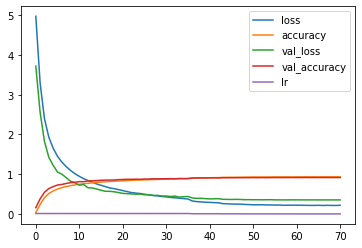

In [19]:
pd.DataFrame(history.history).plot()

In [20]:
model.evaluate(test_generator)

31280/31280 [==============================] - 468s 15ms/step - loss: 0.3479 - accuracy: 0.9178


[0.34794852137565613, 0.9178388714790344]

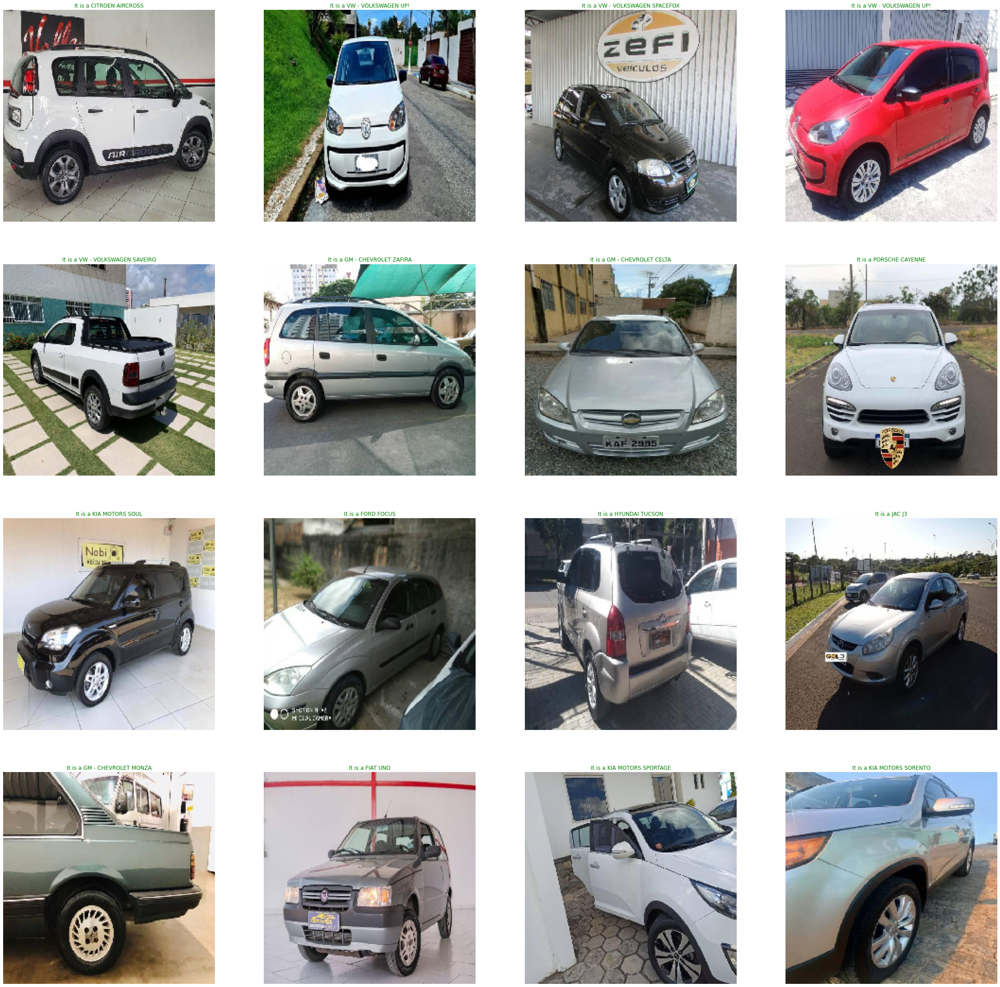

In [22]:
columns = 4
rows = 4
fig=plt.figure(figsize=(40, 40))

class_descriptions = list(test_generator.class_indices.keys())

# Iterate in rows and columns
for i in range(1, columns * rows + 1):
    
    # reserve an spot for the image
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    
    # retrieves the test image and the true label
    img, true_label = test_generator.next()
    
    # makes the prediction using the image
    predicted_label = np.argmax(model.predict(img), axis=-1)[0]
    
    # get a description for the prediction
    prediction_description = class_descriptions[predicted_label]
    
    # get a description for the true value
    true_description = class_descriptions[int(true_label)]
    
    # set the title according to the prediction
    if true_label == predicted_label:
        plt.title("It is a {}".format(prediction_description), color='green')
    else:
        plt.title("Predicted: {} \n What really is: {}".format(prediction_description, true_description), color='red')    
    
    # plot the image
    plt.imshow(img[0])
    
# show the plot
plt.show()

In [23]:
models = pd.DataFrame(class_descriptions, columns=['car_model'])
models.to_csv('190_car_models.csv')
models

,car_model
0,AUDI A3
1,AUDI A4
2,AUDI A5
3,AUDI Q3
4,BMW 320I
...,...
185,VW - VOLKSWAGEN T-CROSS
186,VW - VOLKSWAGEN TIGUAN
187,VW - VOLKSWAGEN UP!
188,VW - VOLKSWAGEN VIRTUS


In [24]:
test_generator.reset()

true_labels, predicted_labels = [], []

total_imgs = len(test_generator.filenames)
idx = 0
while idx < total_imgs:
    img, true_label = test_generator.next()
    true_labels.append(true_label)
    predicted_labels.append(np.argmax(model.predict(img), axis=-1)[0])
    idx += 1

In [25]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(true_labels, predicted_labels, target_names=class_descriptions))

                            precision    recall  f1-score   support

                   AUDI A3       0.90      0.86      0.88       240
                   AUDI A4       0.76      0.81      0.78       108
                   AUDI A5       0.77      0.85      0.81        80
                   AUDI Q3       0.97      0.96      0.97       161
                  BMW 320I       0.87      0.84      0.85       231
                  BMW 328I       0.51      0.63      0.56        52
                    BMW X1       0.96      0.93      0.95       230
                    BMW X3       0.87      0.92      0.89        64
                    BMW X5       0.76      0.92      0.83        51
                    BMW X6       0.94      0.83      0.88        53
                  CHERY QQ       0.98      0.98      0.98        43
             CHERY TIGGO 2       0.98      0.98      0.98        44
          CITROEN AIRCROSS       0.97      0.98      0.97       215
                CITROEN C3       0.96      0.96

In [26]:
model.save('models/car_classifier_resnet50v2_1901types_91percert.h5')